In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:
import numpy as np
import cv2

def transposed_convolution(image, filter_kernel, stride, crop):
    f_k = filter_kernel
    h_in, w_in = image.shape
    h_f, w_f = f_k.shape
    s = stride
    c = crop

    h_out = (h_in - 1) * s + h_f - (2 * c)
    w_out = (w_in - 1) * s + w_f - (2 * c)

    output = np.zeros((h_out, w_out), dtype=np.float64)

    for i in range(h_in):
        for j in range(w_in):

            r_start = (i * s) - c
            c_start = (j * s) - c

            s_c = image[i, j]

            for r_f in range(h_f):
                for c_f in range(w_f):

                    r_target = r_start + r_f
                    c_target = c_start + c_f
                    if (0 <= r_target < h_out) and (0 <= c_target < w_out):
                        output[r_target, c_target] += s_c*f_k[r_f, c_f]

    return output

Filter used:-
[[0 0 0]
 [0 1 0]
 [0 0 0]]


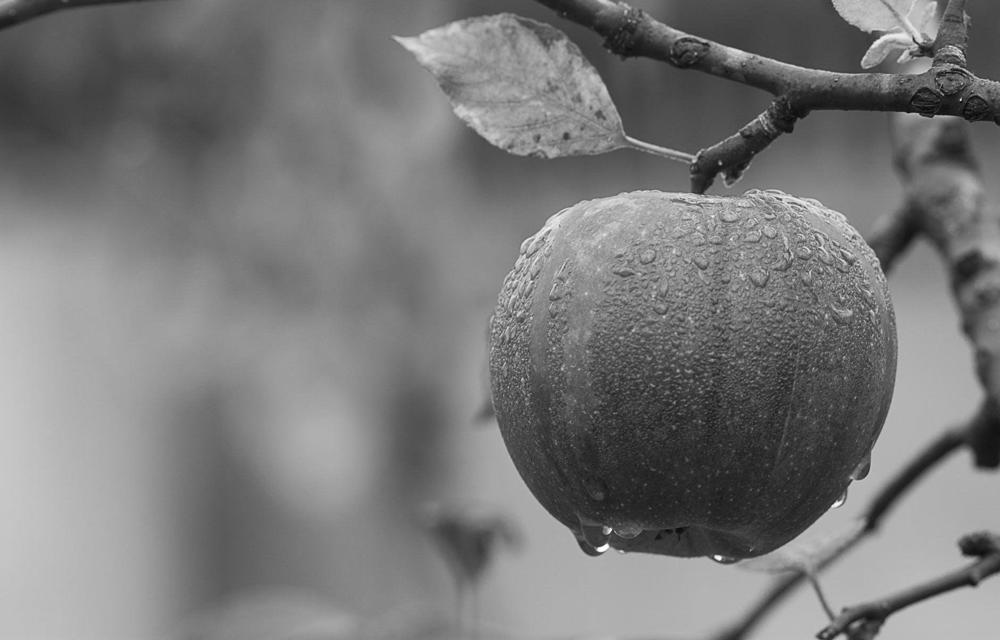

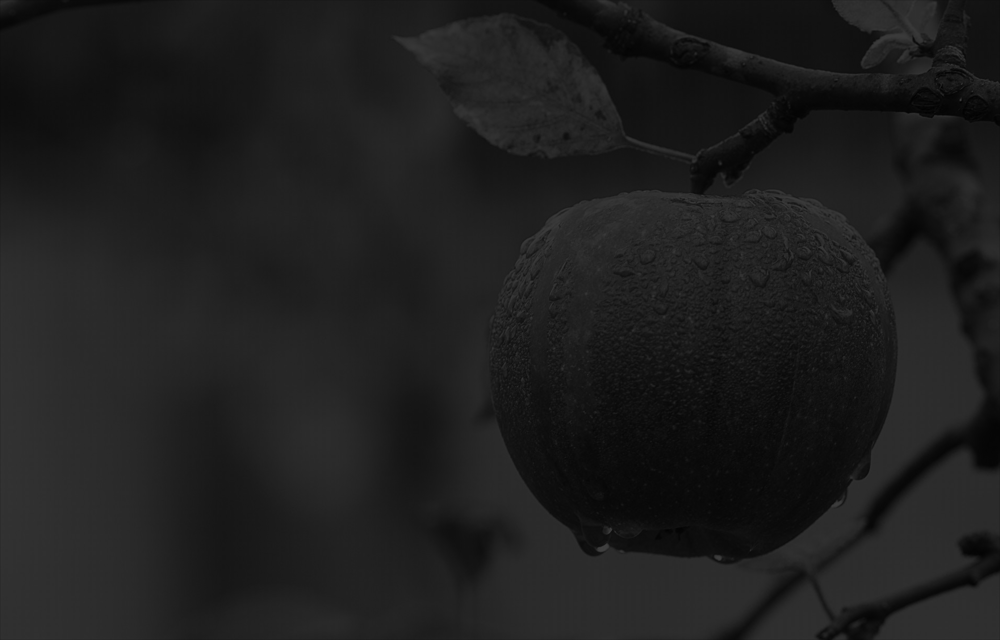

In [ ]:
img = cv2.imread("/content/gray_img.jpeg")
img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

filter_k = np.array([
    [0, 0, 0],
    [0, 1, 0],
    [0, 0, 0]
])
s = 2
c = 0
img_new = transposed_convolution(img_gray,filter_k,s,c)
print("Filter used:-")
print(filter_k)
cv2_imshow(img)
cv2_imshow(img_new)

Filter used:-
[[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]


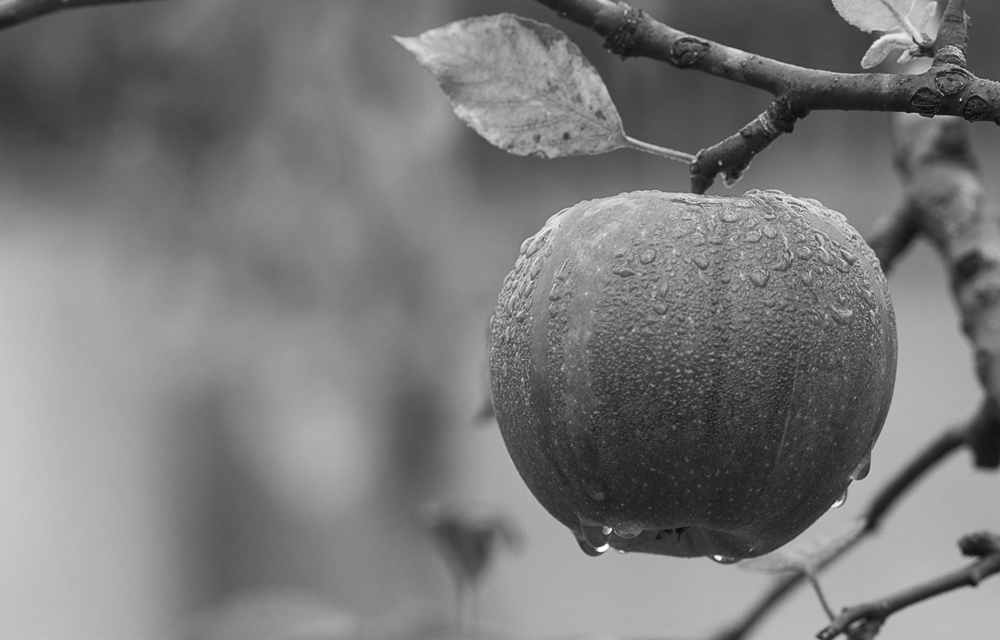

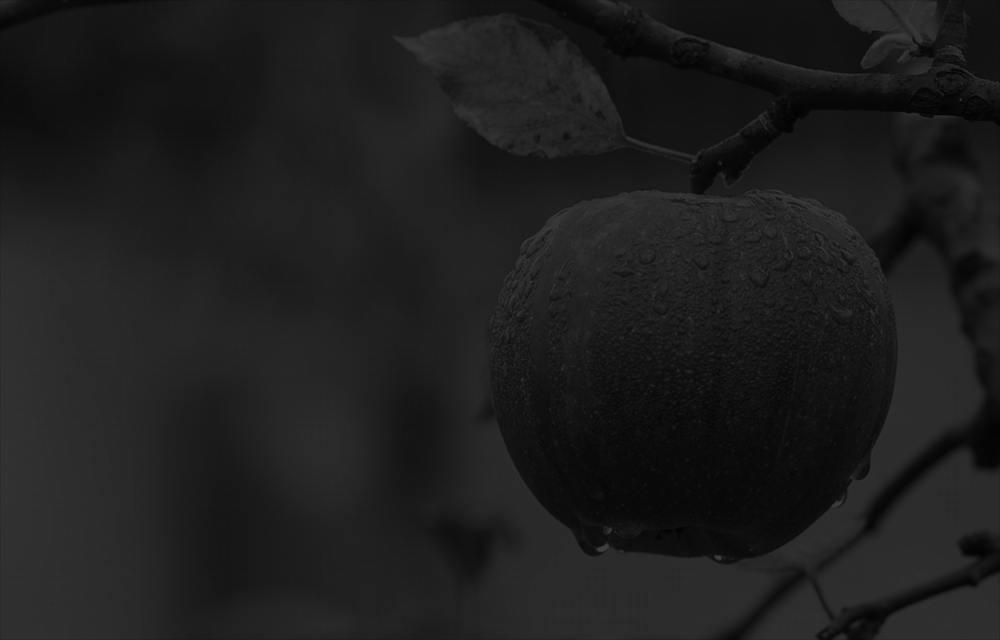

In [ ]:
filter_k = np.array([
    [1/9, 1/9, 1/9],
    [1/9, 1/9, 1/9],
    [1/9, 1/9,1/9]
])
s = 2
c = 0
img_new = transposed_convolution(img_gray,filter_k,s,c)
print("Filter used:-")
print(filter_k)
cv2_imshow(img_gray)
cv2_imshow(img_new)